## Imports
We have 3 important files for this purpose and each and every dependency, class, import, function, variable etc is being imported from these modules

1. `detection_helpers` which I made to wrap the original `YOLOv-7` code along with helper functions
2. `tracking_helpers` has modular code which is used to wrap the `DeepSORT` repo and workings
3. `bridge_wrapper` acts as a bridge to bind **ANY** detection model with `DeepSORT`

In [1]:
from detection_helpers import *
from tracking_helpers import *
from bridge_wrapper import *
from PIL import Image

# Detection
Detect objects using `Yolov-7`

Fusing layers... 
 Convert model to Traced-model... 
 traced_script_module saved! 
 model is traced! 



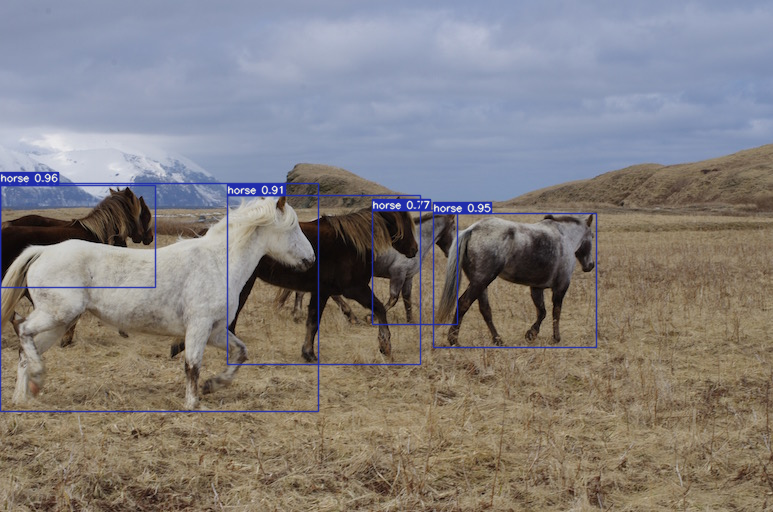

In [4]:
detector = Detector(classes = [0,17,32]) # it'll detect ONLY [person,horses,sports ball]. class = None means detect all classes. List info at: "data/coco.yaml"
detector.load_model('./weights/yolov7x.pt',) # pass the path to the trained weight file


# Pass in any image path or Numpy Image using 'BGR' format
result = detector.detect('./IO_data/input/images/horses.jpg', plot_bb = True) # plot_bb = False output the predictions as [x,y,w,h, confidence, class]


if len(result.shape) == 3:# If it is image, convert it to proper image. detector will give "BGR" image
    result = Image.fromarray(cv2.cvtColor(result,cv2.COLOR_BGR2RGB)) 
    
result

# Tracking

Works as follows:
1. Read each frame of video using `OpenCV`
2. Get Bounding Box or Detections from the model per frame
3. Crop those patches and pass on to `reID` model for re identification which is a part of `DeepSORT` method
4. Get the above embeddings and then use `Kalman Filtering` and `Hungerian assignment` to assign the correct BB to the respective object
5. Show, Save the frames

In [11]:
# Initialise  class that binds detector and tracker in one class
tracker = YOLOv7_DeepSORT(reID_model_path="./deep_sort/model_weights/mars-small128.pb", detector=detector)

# output = None will not save the output video
tracker.track_video("trim.mp4", output="./IO_data/output/trim.avi", show_live = True, skip_frames = 0, count_objects = True, verbose=1)

Processed frame no: 1 || Current FPS: 1.3 || Objects tracked: 20
Processed frame no: 2 || Current FPS: 2.05 || Objects tracked: 19
Processed frame no: 3 || Current FPS: 2.32 || Objects tracked: 22
Processed frame no: 4 || Current FPS: 2.32 || Objects tracked: 22
Processed frame no: 5 || Current FPS: 1.88 || Objects tracked: 20
Processed frame no: 6 || Current FPS: 1.81 || Objects tracked: 22
Processed frame no: 7 || Current FPS: 1.74 || Objects tracked: 22
Processed frame no: 8 || Current FPS: 1.97 || Objects tracked: 19
Processed frame no: 9 || Current FPS: 1.84 || Objects tracked: 22
Processed frame no: 10 || Current FPS: 1.85 || Objects tracked: 21
Processed frame no: 11 || Current FPS: 1.88 || Objects tracked: 21
Processed frame no: 12 || Current FPS: 1.88 || Objects tracked: 21
Processed frame no: 13 || Current FPS: 1.81 || Objects tracked: 23
Processed frame no: 14 || Current FPS: 1.87 || Objects tracked: 22
Processed frame no: 15 || Current FPS: 1.9 || Objects tracked: 23
Proces

KeyboardInterrupt: 

## Scripts for handling Videos on `Colab / Jupyter Notebook`

### Download a video from Youtube

In [5]:
# ! pip install pytube
from pytube import YouTube 

link = "https://www.youtube.com/watch?v=xwT9nMvit2g"
yt = YouTube(link)  

try:
    yt.streams.filter(progressive = True, file_extension = "mp4", resolution = "720p").first().download(output_path = "./", filename = "test.mp4",)
except Exception as e: print(e)

'NoneType' object has no attribute 'download'


### Trim an existing video

In [3]:
# ! pip install moviepy
from moviepy.video.io.ffmpeg_tools import ffmpeg_extract_subclip

ffmpeg_extract_subclip("test.mp4", 10, 100, targetname="box3_trim.mp4") # trim from 10th second to 100th second

Moviepy - Running:
>>> "+ " ".join(cmd)
Moviepy - Command successful


### Show an MP4 video Notebook

In [10]:
from base64 import b64encode
from IPython.display import HTML

mp4 = open('trim.mp4','rb').read()
data_url = "data:video/mp4;base64," + b64encode(mp4).decode()
HTML("""<video width=400 controls><source src="%s" type="video/mp4"></video>""" % data_url)